# Chapter 5 - Text Clustering and Topic Modeling
使用各种大模型进行文档和文本聚类

## 中文学习导读：先表示，再分组，最后解释

文本主题分析通常不是一个单一模型“读懂文章”的过程。这里把任务拆成：用 embedding 表示文档 → 降维以便聚类 → 聚类算法找相似组 → 关键词或生成模型给组贴上可读标签。每一步都有假设和超参数，最终主题需要回到原文抽样核对。


In [54]:
# %%capture
# !pip install bertopic datasets openai datamapplot

In [3]:
import os
os.environ["HF_HOME"] = "/openbayes/home/huggingface"


## 5.1 加载数据, ArXiv 文章: Computation and Language

### 🧠 原理拆解：聚类没有现成的正确答案标签

当前数据包含论文标题和摘要。无监督聚类只根据文本表示之间的距离组织样本，不知道人工定义的“主题类别”。聚类结果是否有用，需要结合代表文档、关键词和领域知识判断；类别编号本身没有语义顺序。


In [5]:
# 加载
from datasets import load_dataset
dataset = load_dataset("maartengr/arxiv_nlp")["train"]

# 查看 metadata 数据
abstracts = dataset["Abstracts"]
titles = dataset["Titles"]

In [8]:
# abstracts[:1], 

titles[:1]


['Introduction to Arabic Speech Recognition Using CMUSphinx System']

In [34]:
abstracts[:1]


['  In this paper Arabic was investigated from the speech recognition problem\npoint of view. We propose a novel approach to build an Arabic Automated Speech\nRecognition System (ASR). This system is based on the open source CMU Sphinx-4,\nfrom the Carnegie Mellon University. CMU Sphinx is a large-vocabulary;\nspeaker-independent, continuous speech recognition system based on discrete\nHidden Markov Models (HMMs). We build a model using utilities from the\nOpenSource CMU Sphinx. We will demonstrate the possible adaptability of this\nsystem to Arabic voice recognition.\n']

## 5.2 文本聚类流程

### 5.2.1 文本表示


### 🧠 原理拆解：embedding 决定聚类能看见什么

先把每篇摘要编码成一个向量，聚类算法随后只接触这些向量，而不是原始语句。若 embedding 模型把某些术语或领域关系表示得不好，后续再复杂的聚类也无法凭空补回信息。`embeddings.shape` 的第二维就是每篇摘要表示的维度。


In [9]:
from sentence_transformers import SentenceTransformer

# Create an embedding for each abstract
embedding_model = SentenceTransformer('thenlper/gte-small')
embeddings = embedding_model.encode(abstracts, show_progress_bar=True)

modules.json:   0%|          | 0.00/385 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/68.1k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/57.0 [00:00<?, ?B/s]

/output/envs/hands-on-llm/lib/python3.10/site-packages/huggingface_hub/file_download.py:1142: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/583 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/66.7M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/394 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/712k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/1405 [00:00<?, ?it/s]

In [12]:
# 检查 embedding 的维度
embeddings.shape

(44949, 384)

### 5.2.2 文本降维


### 🧠 原理拆解：降维是近似，不是无损压缩

UMAP 把高维向量映射到较低维空间，尽量保留局部邻域结构，便于聚类或绘图；不同参数会改变几何结构。二维图是观察工具，不应把图上的远近直接解释为所有语义关系。这里先降到 5 维用于聚类，再降到 2 维用于可视化，目的不同。


In [13]:
# 也可以用 sklearn 的降维方法，比如 sklearn.decomposition.PCA t-SNE 等方法
from umap import UMAP

# 将输入的 embedding 从 384 维降到 5 维
umap_model = UMAP(
    n_components=5, min_dist=0.0, metric='cosine', random_state=42
)
reduced_embeddings = umap_model.fit_transform(embeddings)

/output/envs/hands-on-llm/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [14]:
reduced_embeddings.shape

(44949, 5)

### 5.2.3 根据降维后的 embedding 进行聚类


### 🧠 原理拆解：HDBSCAN 如何形成簇

HDBSCAN 根据密度识别高密度区域，并允许部分点被标记为噪声，而不强迫每篇文档都归入某个主题。`min_cluster_size` 控制可接受主题的最小规模；距离度量和 UMAP 输出维数也会改变结果。参数是建模假设的一部分，应通过稳定性和样本检查来判断。


In [16]:
# 同样可以用 sklearn 的聚类方法，比如 sklearn.cluster.KMeans， DBSCAN 等方法
from hdbscan import HDBSCAN

# euclidean 是欧几里得距离，cluster_selection_method='eom' 是基于模型的聚类方法
hdbscan_model = HDBSCAN(
    min_cluster_size=50, metric='euclidean', cluster_selection_method='eom'
).fit(reduced_embeddings)
clusters = hdbscan_model.labels_

# 查看聚类的数量
len(set(clusters))

152

### 5.2.4 检查聚类结果



>  手动检查 cluster 0 中的前三个文档

In [18]:
import numpy as np

# 打印 cluster 0 中的前三个文档
cluster = 0
for index in np.where(clusters==cluster)[0][:3]:
    print(abstracts[index][:300] + "... \n")

  This works aims to design a statistical machine translation from English text
to American Sign Language (ASL). The system is based on Moses tool with some
modifications and the results are synthesized through a 3D avatar for
interpretation. First, we translate the input text to gloss, a written fo... 

  Researches on signed languages still strongly dissociate lin- guistic issues
related on phonological and phonetic aspects, and gesture studies for
recognition and synthesis purposes. This paper focuses on the imbrication of
motion and meaning for the analysis, synthesis and evaluation of sign lang... 

  Modern computational linguistic software cannot produce important aspects of
sign language translation. Using some researches we deduce that the majority of
automatic sign language translation systems ignore many aspects when they
generate animation; therefore the interpretation lost the truth inf... 



接下来，我们将嵌入降维到2维，以便我们可以绘制它们并对生成的聚类有一个大致的了解。

In [19]:
import pandas as pd

# Reduce 384-dimensional embeddings to 2 dimensions for easier visualization
reduced_embeddings = UMAP(
    n_components=2, min_dist=0.0, metric='cosine', random_state=42
).fit_transform(embeddings)

# Create dataframe
df = pd.DataFrame(reduced_embeddings, columns=["x", "y"])
df["title"] = titles
df["cluster"] = [str(c) for c in clusters]

# Select outliers and non-outliers (clusters)
clusters_df = df.loc[df.cluster != "-1", :]
outliers_df = df.loc[df.cluster == "-1", :]

/output/envs/hands-on-llm/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


### 5.2.5 静态绘图


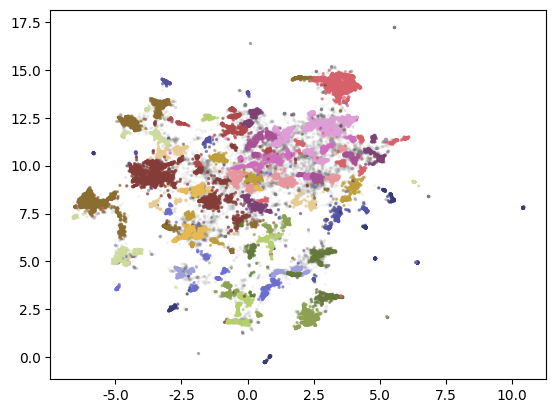

In [29]:
import matplotlib.pyplot as plt

# 分别绘制离群点和非离群点
# 解释：alpha 是透明度，s 是点的大小，cmap 是颜色图
plt.scatter(outliers_df.x, outliers_df.y, alpha=0.05, s=2, c="grey")
plt.scatter(
    clusters_df.x, clusters_df.y, c=clusters_df.cluster.astype(int),
    alpha=0.6, s=2, cmap='tab20b'
)
# plt.savefig("matplotlib.png", dpi=300)  # Uncomment to save the graph as a .png

## 5.3 从文本聚类到主题建模


### 🧠 原理拆解：主题模型是表示与分组的组合

BERTopic 将 embedding、UMAP、HDBSCAN 和关键词表示组件组合起来。文档分组与主题命名是两个不同问题：聚类决定哪些文档在一起，表示模型决定用哪些词概括这组文档。一个主题名称看起来合理，不代表底层分组一定准确。


### 5.3.1 BERTopic: 一个模块化的主题建模框架


### 🧠 原理拆解：c-TF-IDF 为“类”找代表词

BERTopic 可以把同一主题中的文本视作一个聚合文档，然后计算 class-based TF-IDF，让某个主题里常见、在其他主题里少见的词获得更高权重。关键词是统计区分词，不一定是完整、自然的主题说明；应阅读该主题的代表文档核验。


In [33]:
from bertopic import BERTopic

# Train our model with our previously defined models
topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    verbose=False
).fit(abstracts, embeddings)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

现在，让我们开始探索通过运行上面的代码得到的话题。


In [31]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,14052,-1_the_of_and_to,"[the, of, and, to, in, we, that, for, language...",[ Establishing retrieval-based dialogue syste...
1,0,2301,0_question_questions_answer_qa,"[question, questions, answer, qa, answering, a...",[ Multilingual question answering tasks typic...
2,1,2063,1_speech_asr_recognition_end,"[speech, asr, recognition, end, acoustic, spea...","[ Voice Assistants such as Alexa, Siri, and G..."
3,2,1316,2_medical_clinical_biomedical_patient,"[medical, clinical, biomedical, patient, notes...",[ Medical text learning has recently emerged ...
4,3,926,3_translation_nmt_machine_neural,"[translation, nmt, machine, neural, bleu, engl...",[ Neural machine translation (NMT) has recent...
...,...,...,...,...,...
147,146,53,146_backdoor_attacks_attack_triggers,"[backdoor, attacks, attack, triggers, poisoned...",[ Deep neural networks (DNNs) and natural lan...
148,147,53,147_coherence_discourse_text_paragraph,"[coherence, discourse, text, paragraph, cohesi...",[ While there has been significant progress t...
149,148,53,148_multimodal_modality_sentiment_fusion,"[multimodal, modality, sentiment, fusion, moda...",[ Multimodal sentiment analysis is an importa...
150,149,52,149_translation_indian_hindi_smt,"[translation, indian, hindi, smt, machine, eng...",[ In this paper we present our work on a case...


使用默认模型生成了数百个主题！要获取每个主题的前10个关键词以及它们的 c-TF-IDF 权重，我们可以使用`get_topic()`函数：
> TF-IDF 是词频-逆文档频率（Term Frequency-Inverse Document Frequency）的缩写，是一种用于评估词语在文档集合中的重要性的统计方法。
> c-TF-IDF 是类-词频-逆文档频率（Class-based TF-IDF）的缩写，是一种在主题建模中常用的加权方法，它考虑了文档类别对词语重要性的影响。

In [32]:
topic_model.get_topic(0)

[('question', 0.020993254260281362),
 ('questions', 0.015697466184704724),
 ('answer', 0.015612921068877307),
 ('qa', 0.015607122582176858),
 ('answering', 0.014642823903361928),
 ('answers', 0.009809631003119088),
 ('retrieval', 0.00928377567989159),
 ('comprehension', 0.007567193127806112),
 ('reading', 0.007001744069363329),
 ('the', 0.0063081588205285725)]

In [38]:
topic_model.get_document_info(abstracts)[:10]

,Document,Topic,Name,Representation,Representative_Docs,Top_n_words,Probability,Representative_document
0,In this paper Arabic was investigated from t...,-1,-1_the_of_and_to,"[the, of, and, to, in, we, that, for, language...",[ Establishing retrieval-based dialogue syste...,the - of - and - to - in - we - that - for - l...,0.000000,False
1,In this paper we present the creation of an ...,-1,-1_the_of_and_to,"[the, of, and, to, in, we, that, for, language...",[ Establishing retrieval-based dialogue syste...,the - of - and - to - in - we - that - for - l...,0.000000,False
2,Intelligent Input Methods (IM) are essential...,-1,-1_the_of_and_to,"[the, of, and, to, in, we, that, for, language...",[ Establishing retrieval-based dialogue syste...,the - of - and - to - in - we - that - for - l...,0.000000,False
3,This paper includes a reflection on the role...,67,67_brain_reading_eye_surprisal,"[brain, reading, eye, surprisal, eeg, gaze, co...",[ What is the relationship between sentence r...,brain - reading - eye - surprisal - eeg - gaze...,0.551282,False
4,"We test a segmentation algorithm, based on t...",22,22_law_zipf_frequency_words,"[law, zipf, frequency, words, word, of, langua...","[ According to Zipf's meaning-frequency law, ...",law - zipf - frequency - words - word - of - l...,0.246595,False
5,This paper describes the Linguistic Annotati...,130,130_annotation_tools_french_annotations,"[annotation, tools, french, annotations, forma...",[ Data annotation is an important and necessa...,annotation - tools - french - annotations - fo...,1.000000,False
6,We show that a general model of lexical info...,-1,-1_the_of_and_to,"[the, of, and, to, in, we, that, for, language...",[ Establishing retrieval-based dialogue syste...,the - of - and - to - in - we - that - for - l...,0.000000,False
7,This research hypothesized that a practical ...,-1,-1_the_of_and_to,"[the, of, and, to, in, we, that, for, language...",[ Establishing retrieval-based dialogue syste...,the - of - and - to - in - we - that - for - l...,0.000000,False
8,This dissertation presents several new metho...,39,39_sense_wsd_senses_word,"[sense, wsd, senses, word, disambiguation, emb...",[ We present a simple yet effective approach ...,sense - wsd - senses - word - disambiguation -...,1.000000,False
9,This paper describes experiments on learning...,-1,-1_the_of_and_to,"[the, of, and, to, in, we, that, for, language...",[ Establishing retrieval-based dialogue syste...,the - of - and - to - in - we - that - for - l...,0.000000,False


我们可以使用`find_topics()`函数基于搜索词来查找特定主题。让我们搜索一个关于主题建模的主题：

In [39]:
"""
Returns:
    similar_topics: the most similar topics from high to low
    similarity: the similarity scores from high to low
"""
topic_model.find_topics("topic modeling")

([30, -1, 26, 2, 43],
 [0.9550636, 0.91163653, 0.90956366, 0.9059925, 0.90544313])

结果显示主题 30 与我们的搜索词有较高的相似度（0.95）。如果我们进一步检查这个主题，我们可以看到它确实是一个关于主题建模的主题：

In [41]:
topic_model.get_topic(30)

[('topic', 0.06973479192613243),
 ('topics', 0.037386936697629256),
 ('lda', 0.01734549240682987),
 ('latent', 0.014129376309201717),
 ('document', 0.012885645806214301),
 ('modeling', 0.012261940530052482),
 ('documents', 0.012244370612383336),
 ('dirichlet', 0.010467662963944743),
 ('word', 0.008964133977827941),
 ('allocation', 0.00815445305747691)]

这其实就是经典 LDA 技术所特征化的主题。让我们看看 BERTopic 论文是否也被分配到了主题 30

In [42]:
topic_model.topics_[titles.index('BERTopic: Neural topic modeling with a class-based TF-IDF procedure')]

30

### 5.3.2 可视化


文档的可视化

In [43]:
# Visualize topics and documents
fig = topic_model.visualize_documents(
    titles,
    reduced_embeddings=reduced_embeddings,
    width=1200,
    hide_annotations=True
)

# Update fonts of legend for easier visualization
fig.update_layout(font=dict(size=16))

In [45]:
# 可视化带有排名关键词的条形图
topic_model.visualize_barchart()


In [46]:
# 可视化主题之间的关系
topic_model.visualize_heatmap(n_clusters=30)


In [47]:
# 可视化主题的潜在层次结构
topic_model.visualize_hierarchy()

越上层，主题越抽象，越下层，主题越具体，两个进行连线的时候表示两者是相似的

## 5.4 表示模型


### 🧠 原理拆解：保持分组，替换标签解释

表示模型主要改进主题的可读描述，通常不重新训练前面的文档聚类。KeyBERTInspired 偏向找与文档语义相关的词；MMR 在相关性和多样性之间折中，避免关键词过度重复。调 `diversity` 改变的是标签词的选择倾向，不是数据真实主题的数量。


在接下来的这些示例中，我们将在训练模型之后更新我们的主题表示。如果想在训练开始时使用表示模型，我们按以下方式运行它：

```python
from bertopic.representation import KeyBERTInspired
from bertopic import BERTopic

# Create your representation model
representation_model = KeyBERTInspired()

# Use the representation model in BERTopic on top of the default pipeline
topic_model = BERTopic(representation_model=representation_model)
```

为了使用表示模型，我们首先要复制我们的主题模型，这样可以方便地展示有表示模型和没有表示模型的模型之间的差异。

In [49]:
# 保存原始表示
from copy import deepcopy
original_topics = deepcopy(topic_model.topic_representations_)

In [50]:
def topic_differences(model, original_topics, nr_topics=5):
    """显示两个模型之间主题表示的差异"""
    df = pd.DataFrame(columns=["Topic", "Original", "Updated"])
    for topic in range(nr_topics):

        # 提取每个模型每个主题的前5个关键词
        og_words = " | ".join(list(zip(*original_topics[topic]))[0][:5])
        new_words = " | ".join(list(zip(*model.get_topic(topic)))[0][:5])
        df.loc[len(df)] = [topic, og_words, new_words]

    return df

### 5.4.1 KeyBERTInspired

In [52]:
from bertopic.representation import KeyBERTInspired

# 更新我们的主题表示为 KeyBERTInspired
representation_model = KeyBERTInspired()
topic_model.update_topics(abstracts, representation_model=representation_model)

# 显示主题表示的差异
topic_differences(topic_model, original_topics)

,Topic,Original,Updated
0,0,question | questions | answer | qa | answering,answering | questions | question | comprehensi...
1,1,speech | asr | recognition | end | acoustic,transcription | speech | phonetic | voice | la...
2,2,medical | clinical | biomedical | patient | notes,nlp | ehr | clinical | text | ehrs
3,3,translation | nmt | machine | neural | bleu,translation | translating | translate | transl...
4,4,summarization | summaries | summary | abstract...,summarization | summarizers | summaries | summ...


### 5.4.2 Maximal Marginal Relevance

In [53]:
from bertopic.representation import MaximalMarginalRelevance

# 更新我们的主题表示为 MaximalMarginalRelevance
representation_model = MaximalMarginalRelevance(diversity=0.5)
topic_model.update_topics(abstracts, representation_model=representation_model)

# 显示主题表示的差异
topic_differences(topic_model, original_topics)

,Topic,Original,Updated
0,0,question | questions | answer | qa | answering,questions | retrieval | comprehension | knowle...
1,1,speech | asr | recognition | end | acoustic,speech | asr | model | automatic | training
2,2,medical | clinical | biomedical | patient | notes,clinical | biomedical | patients | extraction ...
3,3,translation | nmt | machine | neural | bleu,translation | nmt | neural | bleu | parallel
4,4,summarization | summaries | summary | abstract...,summarization | extractive | rouge | factual |...


KeyBERTInspired 和 Maximal Marginal Relevance 的区别

KeyBERTInspired:
- 基于 KeyBERT 算法，使用 BERT 嵌入来提取关键词
- 通过计算词嵌入和文档嵌入之间的余弦相似度来选择最相关的词
- 倾向于选择语义上最相关的词，可能会导致一些重复

Maximal Marginal Relevance (MMR):
- 在相关性和多样性之间取得平衡
- 通过迭代选择既相关又不同于已选词的词
- 可以通过调整 diversity 参数来控制多样性程度
- 有助于生成更多样化的主题表示，避免重复

主要区别:
- KeyBERTInspired 专注于相关性，MMR 在相关性和多样性之间平衡
- MMR 可以产生更多样化的结果，而 KeyBERTInspired 可能更专注但有重复
- MMR 有一个可调节的多样性参数，KeyBERTInspired 没有这种直接控制


## 5.5 生成模型做文本聚类



### 🧠 原理拆解：让 LLM 总结簇，不是让它验证簇

生成模型可以根据一组代表性文档和关键词撰写主题标签，但它看到的只是传入的样本/关键词。提示内容偏、样本不具代表性或标签过度概括，都会使总结产生误导。先检查簇的代表文档，再评价模型生成的名称。


### 5.5.1 Flan-T5

In [56]:
from transformers import pipeline
from bertopic.representation import TextGeneration

prompt = """I have a topic that contains the following documents:
[DOCUMENTS]

The topic is described by the following keywords: '[KEYWORDS]'.

Based on the documents and keywords, what is this topic about?"""
# bertopic 会默认替换到 [DOCUMENTS] 和 [KEYWORDS]
# 初始文档表示：BERTopic 首先使用预训练的语言模型（如 BERT、RoBERTa 等）将文档转换为向量表示。这一步不需要任何预定义的主题或关键词。

# Update our topic representations using Flan-T5
generator = pipeline(
    'text2text-generation', 
    model='google/flan-t5-small', 
    device="cuda:0"
)
representation_model = TextGeneration(
    generator, prompt=prompt, doc_length=50, tokenizer="whitespace"
)
topic_model.update_topics(abstracts, representation_model=representation_model)

# 显示主题表示的差异
topic_differences(topic_model, original_topics)

You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset


,Topic,Original,Updated
0,0,question | questions | answer | qa | answering,Question answering | | | |
1,1,speech | asr | recognition | end | acoustic,Speech-to-text translation | | | |
2,2,medical | clinical | biomedical | patient | notes,Science/Tech | | | |
3,3,translation | nmt | machine | neural | bleu,Neural machine translation | | | |
4,4,summarization | summaries | summary | abstract...,Science/Tech | | | |


In [58]:
print(abstracts[0])


  In this paper Arabic was investigated from the speech recognition problem
point of view. We propose a novel approach to build an Arabic Automated Speech
Recognition System (ASR). This system is based on the open source CMU Sphinx-4,
from the Carnegie Mellon University. CMU Sphinx is a large-vocabulary;
speaker-independent, continuous speech recognition system based on discrete
Hidden Markov Models (HMMs). We build a model using utilities from the
OpenSource CMU Sphinx. We will demonstrate the possible adaptability of this
system to Arabic voice recognition.



### 5.5.2 OpenAI

In [ ]:
import openai
from bertopic.representation import OpenAI

prompt = """
I have a topic that contains the following documents:
[DOCUMENTS]

The topic is described by the following keywords: [KEYWORDS]

Based on the information above, extract a short topic label in the following format:
topic: <short topic label>
"""

# Update our topic representations using GPT-3.5
client = openai.OpenAI(api_key="YOUR_KEY_HERE")
representation_model = OpenAI(
    client, model="gpt-3.5-turbo", 
    exponential_backoff=True, chat=True, prompt=prompt
)
topic_model.update_topics(abstracts, representation_model=representation_model)

# Show topic differences
topic_differences(topic_model, original_topics)

100%|██████████| 156/156 [02:13<00:00,  1.17it/s]


,Topic,Original,Updated
0,0,speech | asr | recognition | end | acoustic,Leveraging External Data for Improving Low-Res...
1,1,medical | clinical | biomedical | patient | he...,Improved Representation Learning for Biomedica...
2,2,sentiment | aspect | analysis | reviews | opinion,"""Advancements in Aspect-Based Sentiment Analys..."
3,3,translation | nmt | machine | neural | bleu,Neural Machine Translation Enhancements
4,4,summarization | summaries | summary | abstract...,Document Summarization Techniques


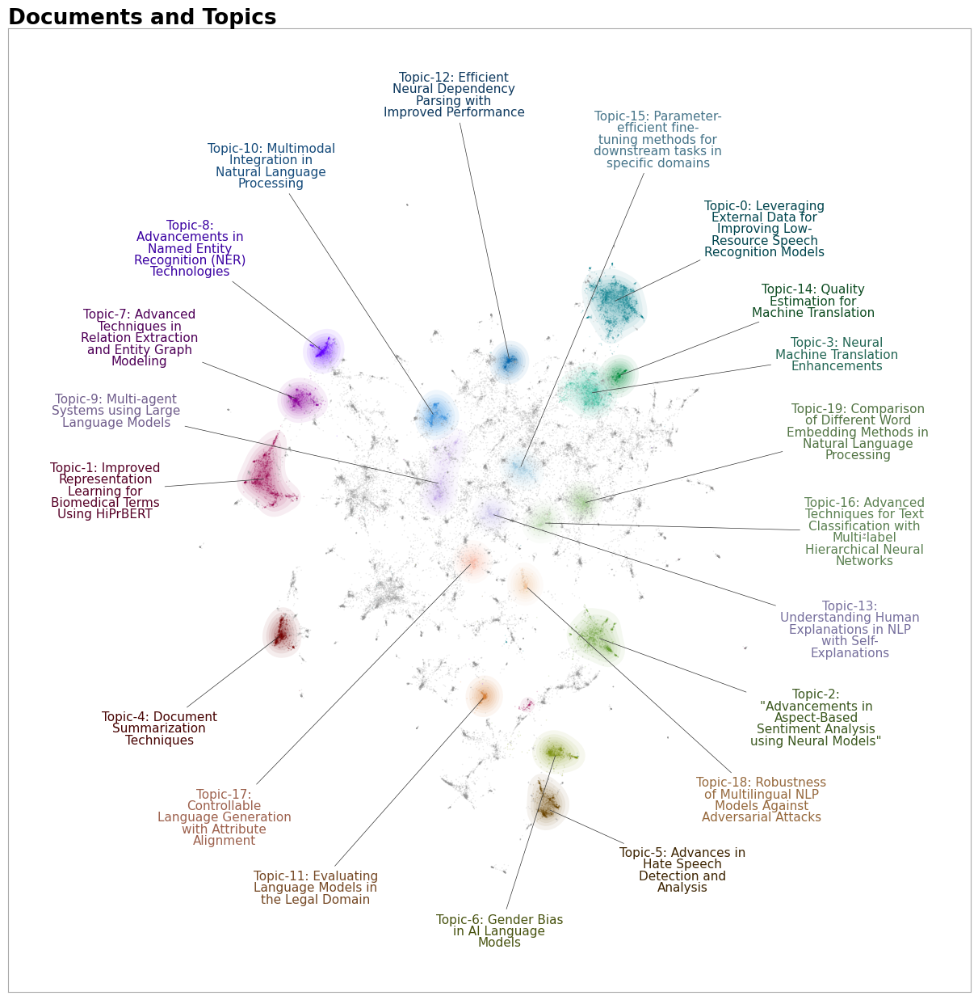

In [ ]:
# Visualize topics and documents
fig = topic_model.visualize_document_datamap(
    titles,
    topics=list(range(20)),
    reduced_embeddings=reduced_embeddings,
    width=1200,
    label_font_size=11,
    label_wrap_width=20,
    use_medoids=True,
)
plt.show()
# plt.savefig("datamapplot.png", dpi=300)


## **BONUS**: 词云

首先，安装 wordcloud 库，然后我们需要确保每个主题由多于10个词来描述，因为这样会使词云更加有趣。
> !pip install wordcloud

In [59]:
topic_model.update_topics(abstracts, top_n_words=500)

2024-10-12 08:34:35,916 - BERTopic - WARNING: Note that extracting more than 100 words from a sparse can slow down computation quite a bit.


Then, we can run the following code to generate the wordcloud for our topic modeling topic:

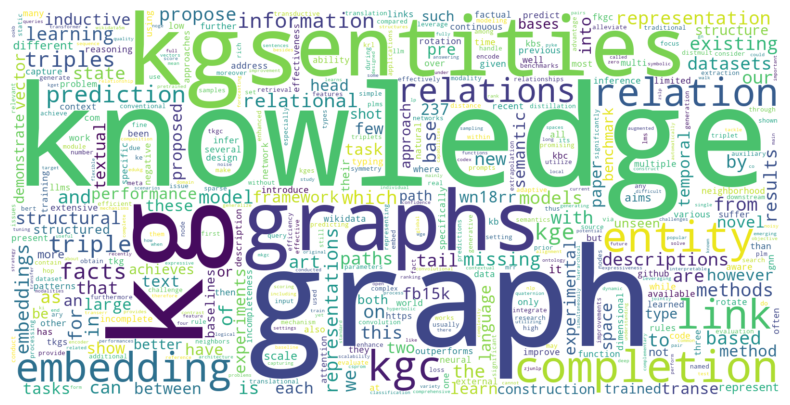

In [61]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def create_wordcloud(model, topic):
    plt.figure(figsize=(10,5))
    text = {word: value for word, value in model.get_topic(topic)}
    wc = WordCloud(background_color="white", max_words=1000, width=1600, height=800)
    wc.generate_from_frequencies(text)
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.show()

# Show wordcloud
create_wordcloud(topic_model, topic=17)